In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.api.types import is_string_dtype

In [5]:
inmate_data = pd.read_csv('inmate_info_with_county.csv')

In [6]:
# Drop the "Unnamed: 0" column
inmate_data.drop(columns=['Unnamed: 0'], inplace=True)

In [17]:
inmate_data['RACE DESC'].unique()

array(['WHITE                         ', 'BLACK                         ',
       'HISPANIC                      ', 'NATIVE AMERICAN               ',
       'OTHER                         ', 'ASIAN                         ',
       'PACIFIC ISLANDER              ', '                              '],
      dtype=object)

In [21]:
# Strip leading and trailing whitespace from "RACE DESC" values
inmate_data['RACE DESC'] = inmate_data['RACE DESC'].str.strip()

# Fill empty values in "RACE DESC" with "Other"
inmate_data.loc[inmate_data['RACE DESC'] == '', 'RACE DESC'] = 'OTHER'

In [22]:
# Fill blank values in "RACE DESC" with "Other"
inmate_data['RACE DESC'].fillna('OTHER', inplace=True)

In [23]:
# Pivot the "RACE DESC" column and calculate the count for each race and county
pivot_df = inmate_data.pivot_table(index='county', columns='RACE DESC', values='ID NUMBER', aggfunc='count', fill_value=0)

# Reset index to make "county" a regular column
pivot_df.reset_index(inplace=True)

In [24]:
pivot_df.head()

RACE DESC,county,ASIAN,BLACK,HISPANIC,NATIVE AMERICAN,OTHER,PACIFIC ISLANDER,WHITE
0,Douglas,28,632,395,120,29,2,1483
1,Johnson,6,291,278,56,12,1,597
2,Lancaster,67,2532,1019,501,95,5,5404
3,Red Willow,8,226,137,52,16,0,946
4,York,1,203,85,90,27,1,584


In [25]:
county_data = {
    "Adams": "001",
    "Antelope": "003",
    "Arthur": "005",
    "Banner": "007",
    "Blaine": "009",
    "Boone": "011",
    "Box Butte": "013",
    "Boyd": "015",
    "Brown": "017",
    "Buffalo": "019",
    "Burt": "021",
    "Butler": "023",
    "Cass": "025",
    "Cedar": "027",
    "Chase": "029",
    "Cherry": "031",
    "Cheyenne": "033",
    "Clay": "035",
    "Colfax": "037",
    "Cuming": "039",
    "Custer": "041",
    "Dakota": "043",
    "Dawes": "045",
    "Dawson": "047",
    "Deuel": "049",
    "Dixon": "051",
    "Dodge": "053",
    "Douglas": "055",
    "Dundy": "057",
    "Fillmore": "059",
    "Franklin": "061",
    "Frontier": "063",
    "Furnas": "065",
    "Gage": "067",
    "Garden": "069",
    "Garfield": "071",
    "Gosper": "073",
    "Grant": "075",
    "Greeley": "077",
    "Hall": "079",
    "Hamilton": "081",
    "Harlan": "083",
    "Hayes": "085",
    "Hitchcock": "087",
    "Holt": "089",
    "Hooker": "091",
    "Howard": "093",
    "Jefferson": "095",
    "Johnson": "097",
    "Kearney": "099",
    "Keith": "101",
    "Keya Paha": "103",
    "Kimball": "105",
    "Knox": "107",
    "Lancaster": "109",
    "Lincoln": "111",
    "Logan": "113",
    "Loup": "115",
    "McPherson": "117",
    "Madison": "119",
    "Merrick": "121",
    "Morrill": "123",
    "Nance": "125",
    "Nemaha": "127",
    "Nuckolls": "129",
    "Otoe": "131",
    "Pawnee": "133",
    "Perkins": "135",
    "Phelps": "137",
    "Pierce": "139",
    "Platte": "141",
    "Polk": "143",
    "Red Willow": "145",
    "Richardson": "147",
    "Rock": "149",
    "Saline": "151",
    "Sarpy": "153",
    "Saunders": "155",
    "Scotts Bluff": "157",
    "Seward": "159",
    "Sheridan": "161",
    "Sherman": "163",
    "Sioux": "165",
    "Stanton": "167",
    "Thayer": "169",
    "Thomas": "171",
    "Thurston": "173",
    "Valley": "175",
    "Washington": "177",
    "Wayne": "179",
    "Webster": "181",
    "Wheeler": "183",
    "York": "185",
    "Out-of-state": "999"
}


In [1]:
!pip install census us

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 1.2 MB 8.8 MB/s eta 0:00:01
  Created wheel for us: filename=us-3.1.1-py3-none-any.whl size=12537 sha256=f8aea7a419478cb70b2d91615186cbf6a4381c5044afd7a41aa1c402e4705c97
  Stored in directory: /scratch/9969262.1.cds/pip-ephem-wheel-cache-iprjfwps/wheels/41/35/e2/c17dd34fe58f9ec2a55440312f14a0f2ea3b9e89e4c39ade5e
Successfully built us
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sciris 1.1.1 requires xlrd==1.2.0, but you have xlrd 0.7.1 which is incompatible.
You should consider upgrading via the '/share/pkg.7/python3/3.8.10/install/bin/python3.8 -m pip install --upgrade pip' command.


In [5]:
from census import Census
from us import states

API_KEY = '8c7d0af17c7bac1402d00779c41820156439acdb'
c = Census(API_KEY)

# Get population data for Nebraska from the latest available year (let's say 2019 as an example)
nebraska_data = c.acs5.state(('NAME', 'B01003_001E'), states.NE.fips, year=2019)

# Extract and print the data
for data in nebraska_data:
    print(f"State: {data['NAME']}")
    print(f"Population: {data['B01003_001E']}")

State: Nebraska
Population: 1914571.0


In [7]:
# Define a function to fetch and print data for a given year
def fetch_data(year):
    # Adjust your data codes as necessary. This is just a basic example.
    if year in [1990, 2000, 2010]:
        data = c.sf1.state(('NAME', 'P001001', 'P012001'), states.NE.fips, year=year)
        # P001001 is total population, P012001 is median age, add others as needed
    else:
        data = c.acs5.state(('NAME', 'B01003_001E', 'B01002_001E'), states.NE.fips, year=year)
        # B01003_001E is total population, B01002_001E is median age, add others as needed

    for entry in data:
        print(f"Year: {year}")
        print(f"State: {entry['NAME']}")
        print(f"Population: {entry.get('P001001', entry.get('B01003_001E'))}")
        print(f"Median Age: {entry.get('P012001', entry.get('B01002_001E'))}")
        print("--------------------------------------------------")

# Fetch data for the range 1990-2023
for year in range(2010, 2024):
    fetch_data(year)

Year: 2010
State: Nebraska
Population: 1826341
Median Age: 1826341.0
--------------------------------------------------
Year: 2011
State: Nebraska
Population: 1813061.0
Median Age: 36.3
--------------------------------------------------
Year: 2012
State: Nebraska
Population: 1827306.0
Median Age: 36.3
--------------------------------------------------
Year: 2013
State: Nebraska
Population: 1841625.0
Median Age: 36.3
--------------------------------------------------
Year: 2014
State: Nebraska
Population: 1855617.0
Median Age: 36.2
--------------------------------------------------
Year: 2015
State: Nebraska
Population: 1869365.0
Median Age: 36.2
--------------------------------------------------
Year: 2016
State: Nebraska
Population: 1881259.0
Median Age: 36.2
--------------------------------------------------
Year: 2017
State: Nebraska
Population: 1893921.0
Median Age: 36.3
--------------------------------------------------
Year: 2018
State: Nebraska
Population: 1904760.0
Median Age: 

UnsupportedYearException: Geography is not available in 2022. Available years include (2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010, 2009)

In [8]:
# Fetch and print data for the year 2010
def fetch_data_2010():
    fields = (
        'NAME', 'P005001', 'P005003', 'P005004', 'P005005', 'P005006', 
        'P012002', 'P012026'
    )
    data = c.sf1.state(fields, states.NE.fips, year=2010)

    for entry in data:
        print(f"State: {entry['NAME']}")
        print(f"Total Population: {entry['P005001']}")
        print(f"White Population: {entry['P005003']}")
        print(f"Black or African American Population: {entry['P005004']}")
        print(f"American Indian and Alaska Native Population: {entry['P005005']}")
        print(f"Asian Population: {entry['P005006']}")
        print(f"Male Population: {entry['P012002']}")
        print(f"Female Population: {entry['P012026']}")
        print("--------------------------------------------------")

fetch_data_2010()

State: Nebraska
Total Population: 1826341.0
White Population: 1499753.0
Black or African American Population: 80959.0
American Indian and Alaska Native Population: 14797.0
Asian Population: 31919.0
Male Population: 906296.0
Female Population: 920045.0
--------------------------------------------------


In [9]:
# Fetch and print data by county for the year 2010
def fetch_data_by_county_2010():
    fields = (
        'NAME', 'P005001', 'P005003', 'P005004', 'P005005', 'P005006', 
        'P012002', 'P012026'
    )
    # '*' is a wildcard that fetches data for all counties in Nebraska
    data = c.sf1.state_county(fields, states.NE.fips, '*', year=2010)

    for entry in data:
        print(f"County: {entry['NAME']}")
        print(f"Total Population: {entry['P005001']}")
        print(f"White Population: {entry['P005003']}")
        print(f"Black or African American Population: {entry['P005004']}")
        print(f"American Indian and Alaska Native Population: {entry['P005005']}")
        print(f"Asian Population: {entry['P005006']}")
        print(f"Male Population: {entry['P012002']}")
        print(f"Female Population: {entry['P012026']}")
        print("--------------------------------------------------")

fetch_data_by_county_2010()

County: Box Butte County, Nebraska
Total Population: 11308.0
White Population: 9564.0
Black or African American Population: 49.0
American Indian and Alaska Native Population: 328.0
Asian Population: 33.0
Male Population: 5541.0
Female Population: 5767.0
--------------------------------------------------
County: Adams County, Nebraska
Total Population: 31364.0
White Population: 27747.0
Black or African American Population: 219.0
American Indian and Alaska Native Population: 104.0
Asian Population: 436.0
Male Population: 15600.0
Female Population: 15764.0
--------------------------------------------------
County: Blaine County, Nebraska
Total Population: 478.0
White Population: 474.0
Black or African American Population: 1.0
American Indian and Alaska Native Population: 0.0
Asian Population: 0.0
Male Population: 247.0
Female Population: 231.0
--------------------------------------------------
County: Boone County, Nebraska
Total Population: 5505.0
White Population: 5383.0
Black or Africa

In [20]:
def fetch_data_by_county(year_to_collect):
    fields = (
        'NAME', 'P005001', 'P005003', 'P004002', 'P004003', 'P005004', 'P005005', 'P005006', 
        'P012002', 'P012026'
    )
    data = c.sf1.state_county(fields, states.NE.fips, '*', year=year_to_collect)

    # Create a list to store the structured data
    rows = []
    for entry in data:
        row = {
            'County': entry['NAME'],
            'Total Population': entry['P005001'],
            'White Population': entry['P005003'],
            'Hispanic or Latino Population': entry['P004002'],
            'Not Hispanic or Latino Population': entry['P004003'],
            'Black or African American Population': entry['P005004'],
            'American Indian and Alaska Native Population': entry['P005005'],
            'Asian Population': entry['P005006'],
            'Male Population': entry['P012002'],
            'Female Population': entry['P012026']
        }
        rows.append(row)

    # Convert the list to a pandas DataFrame
    df = pd.DataFrame(rows)
    return df

In [17]:
neb_2010 = pd.DataFrame()

In [24]:
neb_2010 = fetch_data_by_county(2011)






UnsupportedYearException: Geography is not available in 2011. Available years include (2010,)

In [19]:
neb_2010.head()

,County,Total Population,White Population,Hispanic or Latino Population,Not Hispanic or Latino Population,Black or African American Population,American Indian and Alaska Native Population,Asian Population,Male Population,Female Population
0,"Box Butte County, Nebraska",11308.0,9564.0,10151.0,1157.0,49.0,328.0,33.0,5541.0,5767.0
1,"Adams County, Nebraska",31364.0,27747.0,28820.0,2544.0,219.0,104.0,436.0,15600.0,15764.0
2,"Blaine County, Nebraska",478.0,474.0,478.0,0.0,1.0,0.0,0.0,247.0,231.0
3,"Boone County, Nebraska",5505.0,5383.0,5440.0,65.0,23.0,11.0,10.0,2749.0,2756.0
4,"Boyd County, Nebraska",2099.0,2024.0,2066.0,33.0,1.0,9.0,17.0,1038.0,1061.0


In [51]:
def fetch_data_by_county_acs(Year):
    # Define fields to fetch
    # Note: ACS might use different field codes than the decennial census!
    fields = (
        'NAME', 'B01001_001E', 'B02001_002E', 'B02001_003E', 'B02001_004E', 
        'B02001_005E', 'B01001_002E', 'B01001_026E', 'B03002_003E',  'B19013_001E', 'B19013A_001E', 
        'B19013B_001E', 'B19013C_001E', 'B19013D_001E', 'B19013E_001E', 'B19013F_001E', 'B19013G_001E', 
        'B19013I_001E', 'B16001_002E', 'B16001_003E', 'B16001_006E', 'B16001_009E', 'B16001_012E'
   
    )

    # Fetch data from ACS 2005-2009 5-year estimates
    data = c.acs5.state_county(fields, states.NE.fips, '*', year=Year)  # 5-Year Estimates for 2005-2009 are labeled as 2009

    # Create a list to store the structured data
    rows = []
    for entry in data:
        row = {
            'County': entry['NAME'],
            'Total Population': entry['B01001_001E'],
            'White Population': entry['B02001_002E'],
            'Black or African American Population': entry['B02001_003E'],
            'American Indian and Alaska Native Population': entry['B02001_004E'],
            'Asian Population': entry['B02001_005E'],
            'Male Population': entry['B01001_002E'],
            'Female Population': entry['B01001_026E'],
            'Hispanic or Latino Population': entry['B03002_003E'],
            'Median Household Income (Overall)': entry['B19013_001E'],
            'Median Household Income (White Alone)': entry['B19013A_001E'],
            'Median Household Income (Black or African American Alone)': entry['B19013B_001E'],
            'Median Household Income (American Indian and Alaska Native Alone)': entry['B19013C_001E'],
            'Median Household Income (Asian Alone)': entry['B19013D_001E'],
            'Median Household Income (Native Hawaiian and Other Pacific Islander Alone)': entry['B19013E_001E'],
            'Median Household Income (Some Other Race Alone)': entry['B19013F_001E'],
            'Median Household Income (Two or More Races)': entry['B19013G_001E'],
            'Median Household Income (Hispanic or Latino)': entry['B19013I_001E'],
            'Speak Only English at Home (Population 5 years and over)': entry['B16001_002E'],
            'Speak Spanish at Home (Population 5 years and over)': entry['B16001_003E'],
            'Speak Other Indo-European Languages at Home (Population 5 years and over)': entry['B16001_006E'],
            'Speak Asian and Pacific Island Languages at Home (Population 5 years and over)': entry['B16001_009E'],
            'Speak Other Languages at Home (Population 5 years and over)': entry['B16001_012E']
        }
        rows.append(row)

    # Convert the list to a pandas DataFrame
    df = pd.DataFrame(rows)
    df['Year'] = Year
    return df


In [55]:
# Define the column names
columns = ['County', 'Total Population', 'White Population',
       'Black or African American Population',
       'American Indian and Alaska Native Population', 'Asian Population',
       'Male Population', 'Female Population', 'Hispanic or Latino Population',
       'Median Household Income (Overall)',
       'Median Household Income (White Alone)',
       'Median Household Income (Black or African American Alone)',
       'Median Household Income (American Indian and Alaska Native Alone)',
       'Median Household Income (Asian Alone)',
       'Median Household Income (Native Hawaiian and Other Pacific Islander Alone)',
       'Median Household Income (Some Other Race Alone)',
       'Median Household Income (Two or More Races)',
       'Median Household Income (Hispanic or Latino)',
       'Speak Only English at Home (Population 5 years and over)',
       'Speak Spanish at Home (Population 5 years and over)',
       'Speak Other Indo-European Languages at Home (Population 5 years and over)',
       'Speak Asian and Pacific Island Languages at Home (Population 5 years and over)',
       'Speak Other Languages at Home (Population 5 years and over)', 'Year']

# Create an empty DataFrame with the specified columns
neb = pd.DataFrame(columns=columns)

for year in range(2009, 2022):
    neb_temp = fetch_data_by_county_acs(year)
    global neb
    neb = pd.concat([neb, neb_temp], ignore_index=True)

In [56]:
neb['Year'].unique()

array([2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021], dtype=object)

In [60]:
neb.to_csv('Nebraska_Census_By_County_Population_and_Income.csv', index=False)

In [2]:
neb = pd.read_csv('Nebraska_Census_By_County_Population_and_Income.csv')

In [3]:
offences_neb = pd.read_csv('offences.csv')

In [4]:
offences_neb.columns

Index(['ID NUMBER', 'OFFENSE MINIMUM YEAR OR TERM', 'MINIMUM MONTH',
       'MINIMUM DAY', 'OFFENSE MAXIMUM YEAR OR TERM', 'MAXIMUM MONTH',
       'MAXIMUM DAY', 'OFFENSE MAN MIN YEAR OR TERM', 'MAN MIN MONTH',
       'MAN MIN DAY', 'OFFENSE ARREST DESC', 'FELONY MSDMNR CODE',
       'FELONY MSDMNR DESC', 'OFFENSE TYPE CODE', 'OFFENSE ATTEMPT DESC',
       'HABITUAL CRIMINAL', 'OFFENSE RUN CODE', 'COUNTY COMMITTED'],
      dtype='object')

In [5]:
inmate_neb = pd.read_csv('inmateDB.csv')

/share/pkg.7/python3/3.8.10/install/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3169: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [6]:
inmate_neb.columns

Index(['ID NUMBER', 'COMMITTED LAST NAME', 'FIRST NAME', 'MIDDLE NAME',
       'NAME EXTENSION', 'LEGAL LAST NAME', 'FIRST NAME.1', 'MIDDLE NAME.1',
       'NAME EXTENSION.1', 'DATE OF BIRTH', 'RACE DESC', 'GENDER', 'FACILITY',
       'CURRENT SENTENCE PARDONED OR COMMUTED DATE', 'GUN CLAUSE',
       'SENTENCE BEGIN DATE', 'MIN TERM/YEAR', 'MIN MONTH', 'MIN DAY',
       'MAX TERM/YEAR', 'MAX MONTH', 'MAX DAY', 'MAN MIN TERM/YEAR',
       'MAN MIN MONTH', 'MAN MIN DAY', 'MAN MIN TERM DATE',
       'PAROLE ELIGIBILITY DATE', 'EARLIEST POSSIBLE RELEASE DATE',
       'GOOD TIME LAW', 'CURRENT STATUS', 'INST RELEASE DATE',
       'INST RELEASE TYPE', 'PAROLE BOARD NEXT REVIEW DATE(MONTH&YEAR)',
       'PAROLE BOARD FINAL HEARING DATE(MONTH&YEAR)', 'PAROLE BOARD STATUS',
       'PAROLE RELEASE DATE', 'PAROLE DISCHARGE DESC'],
      dtype='object')

In [13]:
# Merge the DataFrames on 'ID NUMBER'
merged_df = offences_neb.merge(inmate_neb[['ID NUMBER', 'COMMITTED LAST NAME', 'FIRST NAME', 'MIDDLE NAME',
                           'NAME EXTENSION', 'LEGAL LAST NAME', 'DATE OF BIRTH',
                           'SENTENCE BEGIN DATE','DATE OF BIRTH', 'RACE DESC', 'GENDER','INST RELEASE DATE',
       'INST RELEASE TYPE']],
                      on='ID NUMBER', how='left')


In [14]:
# Assuming you have merged_df from the previous step
merged_df['Year of Sentence'] = merged_df['SENTENCE BEGIN DATE'].apply(lambda x: pd.to_datetime(x).year)


In [17]:
merged_df.columns

Index(['ID NUMBER', 'OFFENSE MINIMUM YEAR OR TERM', 'MINIMUM MONTH',
       'MINIMUM DAY', 'OFFENSE MAXIMUM YEAR OR TERM', 'MAXIMUM MONTH',
       'MAXIMUM DAY', 'OFFENSE MAN MIN YEAR OR TERM', 'MAN MIN MONTH',
       'MAN MIN DAY', 'OFFENSE ARREST DESC', 'FELONY MSDMNR CODE',
       'FELONY MSDMNR DESC', 'OFFENSE TYPE CODE', 'OFFENSE ATTEMPT DESC',
       'HABITUAL CRIMINAL', 'OFFENSE RUN CODE', 'COUNTY COMMITTED',
       'COMMITTED LAST NAME', 'FIRST NAME', 'MIDDLE NAME', 'NAME EXTENSION',
       'LEGAL LAST NAME', 'DATE OF BIRTH', 'SENTENCE BEGIN DATE',
       'DATE OF BIRTH', 'RACE DESC', 'GENDER', 'INST RELEASE DATE',
       'INST RELEASE TYPE', 'Year of Sentence'],
      dtype='object')

In [120]:
filtered_df = merged_df[(merged_df['Year of Sentence'] >= 1990) & (merged_df['Year of Sentence'] <= 2021)]
filtered_df['COUNTY COMMITTED'] = filtered_df['COUNTY COMMITTED'].str.strip()
filtered_df = filtered_df[filtered_df['COUNTY COMMITTED'] != '']
filtered_df = filtered_df[filtered_df['COUNTY COMMITTED'] != 'OUT OF STATE']
filtered_df['RACE DESC'] = filtered_df['RACE DESC'].replace(['                              ', 'HAWAIIAN ISLANDER             '], 'OTHER')
filtered_df['RACE DESC'] = filtered_df['RACE DESC'].str.strip()

<ipython-input-120-21052ff7dc36>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['COUNTY COMMITTED'] = filtered_df['COUNTY COMMITTED'].str.strip()


In [121]:
filtered_df['County'] = filtered_df['COUNTY COMMITTED'].apply(lambda x: f'{x.strip().capitalize()} County, Nebraska')

In [21]:
neb['County'].unique()

array(['Adams County, Nebraska', 'Antelope County, Nebraska',
       'Arthur County, Nebraska', 'Banner County, Nebraska',
       'Blaine County, Nebraska', 'Boone County, Nebraska',
       'Box Butte County, Nebraska', 'Boyd County, Nebraska',
       'Brown County, Nebraska', 'Buffalo County, Nebraska',
       'Burt County, Nebraska', 'Butler County, Nebraska',
       'Cass County, Nebraska', 'Cedar County, Nebraska',
       'Chase County, Nebraska', 'Cherry County, Nebraska',
       'Cheyenne County, Nebraska', 'Clay County, Nebraska',
       'Colfax County, Nebraska', 'Cuming County, Nebraska',
       'Custer County, Nebraska', 'Dakota County, Nebraska',
       'Dawes County, Nebraska', 'Dawson County, Nebraska',
       'Deuel County, Nebraska', 'Dixon County, Nebraska',
       'Dodge County, Nebraska', 'Douglas County, Nebraska',
       'Dundy County, Nebraska', 'Fillmore County, Nebraska',
       'Franklin County, Nebraska', 'Frontier County, Nebraska',
       'Furnas County, Nebr

In [43]:
filtered_df['County'].unique()

array(['Douglas County, Nebraska', 'Lancaster County, Nebraska',
       'Hall County, Nebraska', 'Saunders County, Nebraska',
       'Adams County, Nebraska', 'Sarpy County, Nebraska',
       'Saline County, Nebraska', 'Richardson County, Nebraska',
       'Johnson County, Nebraska', 'Washington County, Nebraska',
       'Lincoln County, Nebraska', 'Platte County, Nebraska',
       'Madison County, Nebraska', 'Hitchcock County, Nebraska',
       'Red willow County, Nebraska', 'Thurston County, Nebraska',
       'Dawson County, Nebraska', 'Perkins County, Nebraska',
       'Colfax County, Nebraska', 'Butler County, Nebraska',
       'Clay County, Nebraska', 'York County, Nebraska',
       'Otoe County, Nebraska', 'Dodge County, Nebraska',
       'Merrick County, Nebraska', 'Polk County, Nebraska',
       'Logan County, Nebraska', 'Stanton County, Nebraska',
       'Pierce County, Nebraska', 'Dakota County, Nebraska',
       'Hamilton County, Nebraska', 'Nance County, Nebraska',
       '

In [44]:
filtered_df['RACE DESC'].unique()

array(['BLACK', 'WHITE', 'NATIVE AMERICAN', 'HISPANIC', 'OTHER', 'ASIAN',
       'PACIFIC ISLANDER'], dtype=object)

In [45]:
filtered_df.columns

Index(['ID NUMBER', 'OFFENSE MINIMUM YEAR OR TERM', 'MINIMUM MONTH',
       'MINIMUM DAY', 'OFFENSE MAXIMUM YEAR OR TERM', 'MAXIMUM MONTH',
       'MAXIMUM DAY', 'OFFENSE MAN MIN YEAR OR TERM', 'MAN MIN MONTH',
       'MAN MIN DAY', 'OFFENSE ARREST DESC', 'FELONY MSDMNR CODE',
       'FELONY MSDMNR DESC', 'OFFENSE TYPE CODE', 'OFFENSE ATTEMPT DESC',
       'HABITUAL CRIMINAL', 'OFFENSE RUN CODE', 'COUNTY COMMITTED',
       'COMMITTED LAST NAME', 'FIRST NAME', 'MIDDLE NAME', 'NAME EXTENSION',
       'LEGAL LAST NAME', 'DATE OF BIRTH', 'SENTENCE BEGIN DATE',
       'DATE OF BIRTH', 'RACE DESC', 'GENDER', 'Year of Sentence', 'County'],
      dtype='object')

In [24]:
# Group by 'Year of Sentence' and 'Formatted County', and sum the races
grouped = filtered_df.groupby(['Year of Sentence', 'County'])['RACE DESC'].value_counts().unstack(fill_value=0)

# Reset the index to make 'Year of Sentence' and 'Formatted County' regular columns
grouped = grouped.reset_index()
grouped['Year of Sentence'] = grouped['Year of Sentence'].astype(int)

In [25]:
grouped.head(100)

RACE DESC,Year of Sentence,County,ASIAN,BLACK,HISPANIC,NATIVE AMERICAN,OTHER,PACIFIC ISLANDER,WHITE
0,2009,"Adams County, Nebraska",0,7,15,0,0,0,75
1,2009,"Antelope County, Nebraska",0,0,0,0,0,0,7
2,2009,"Boone County, Nebraska",0,0,0,0,0,0,1
3,2009,"Box butte County, Nebraska",0,0,4,2,0,0,20
4,2009,"Brown County, Nebraska",0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...
95,2010,"Dixon County, Nebraska",0,0,4,0,0,0,2
96,2010,"Dodge County, Nebraska",0,11,14,3,0,0,79
97,2010,"Douglas County, Nebraska",11,620,148,27,12,1,549
98,2010,"Fillmore County, Nebraska",0,0,0,0,0,0,12


In [121]:
grouped.to_csv('Nebraska_By_Year_And_County_Offences_Counts.csv', index=False)

In [29]:
# 1. Group by Year, County, and Race for Top 5 Offense Types

grouped_race = (filtered_df.groupby(['Year of Sentence', 'County', 'RACE DESC'])
                .apply(lambda group: group['OFFENSE ARREST DESC'].value_counts().head(5))
                .reset_index(name='Count')
                .rename(columns={'level_3': 'Offense Type'}))

# 2. Group by Year and County for Top 5 Overall Offense Types

grouped_overall = (filtered_df.groupby(['Year of Sentence', 'County'])
                  .apply(lambda group: group['OFFENSE ARREST DESC'].value_counts().head(5))
                  .reset_index(name='Count')
                  .rename(columns={'level_2': 'Offense Type'}))

In [31]:
grouped_race.head(100)

,Year of Sentence,County,RACE DESC,Offense Type,Count
0,2009.0,"Adams County, Nebraska",BLACK,BURGLARY,1
1,2009.0,"Adams County, Nebraska",BLACK,POSSESSION OF METHAMPHETAMINE,1
2,2009.0,"Adams County, Nebraska",BLACK,POS FIREARM BY FUGITIVE/FELON,1
3,2009.0,"Adams County, Nebraska",BLACK,THEFT BY TAKING $200-499,1
4,2009.0,"Adams County, Nebraska",BLACK,THEFT BY UNLAWFUL TAKING,1
...,...,...,...,...,...
95,2009.0,"Colfax County, Nebraska",WHITE,POSSESS CONTROLLED SUBSTANCE,1
96,2009.0,"Colfax County, Nebraska",WHITE,POS ANHYDROUS AMMONIA W/I MANU,1
97,2009.0,"Colfax County, Nebraska",WHITE,POSS C/S-W/INT TO DEL-MAR-A&A,1
98,2009.0,"Cuming County, Nebraska",BLACK,THEFT BY UNLWFL TAKING OR DISP,1


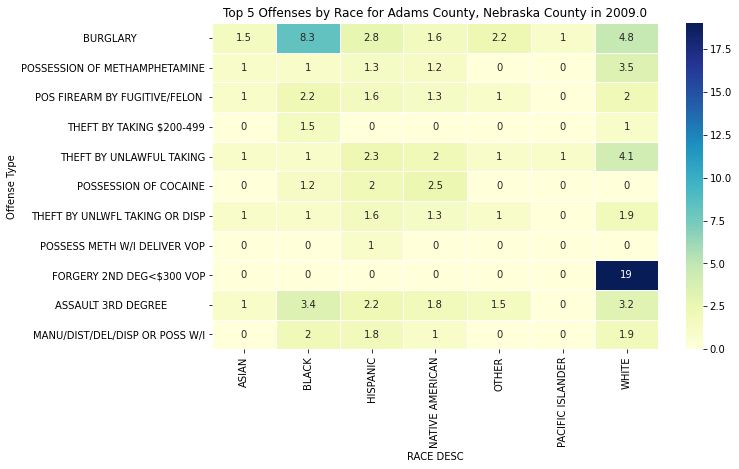

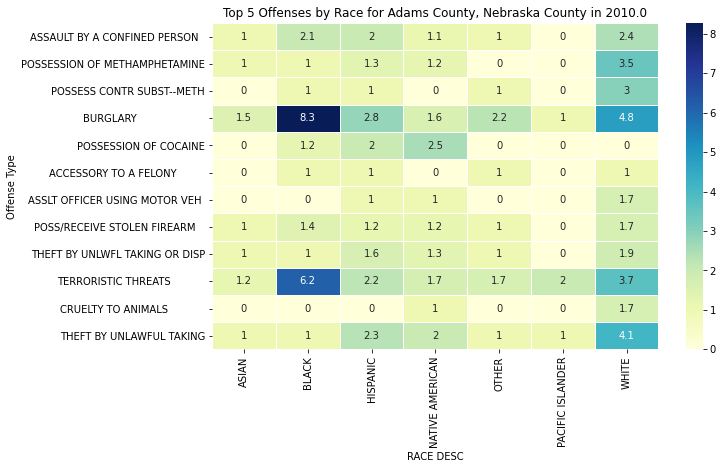

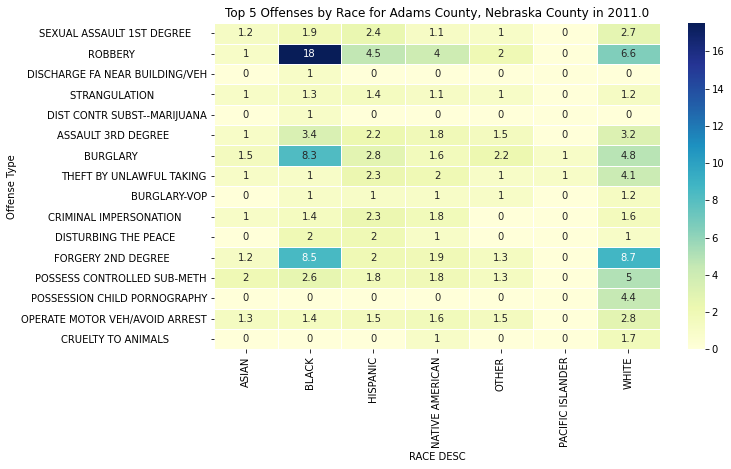

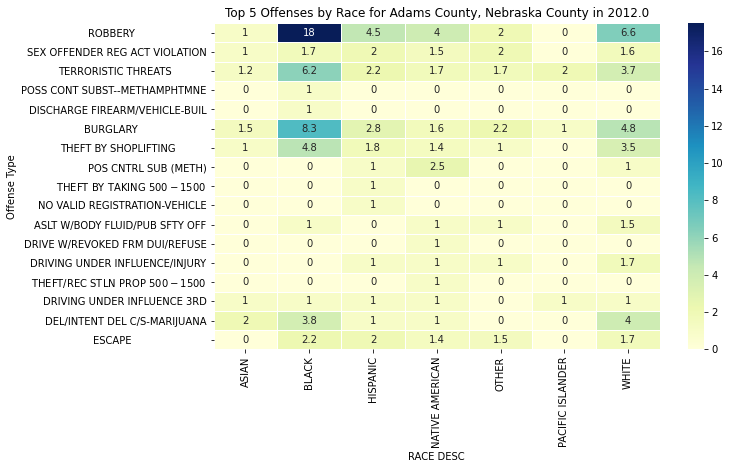

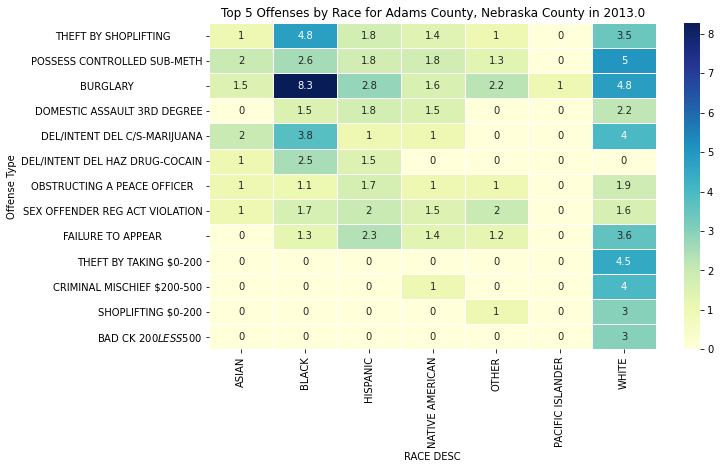

...

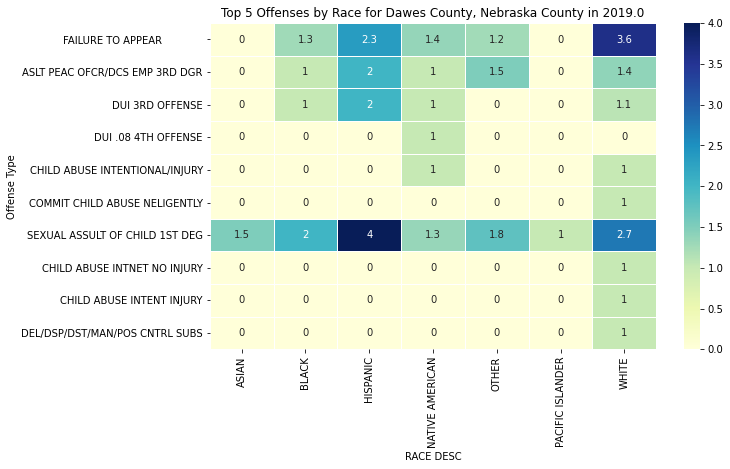

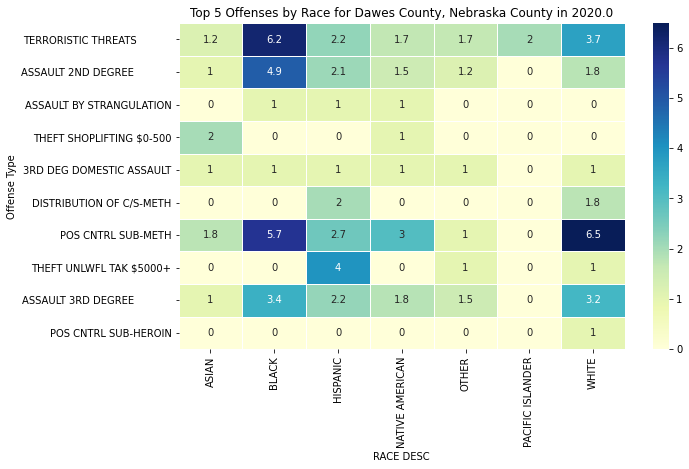

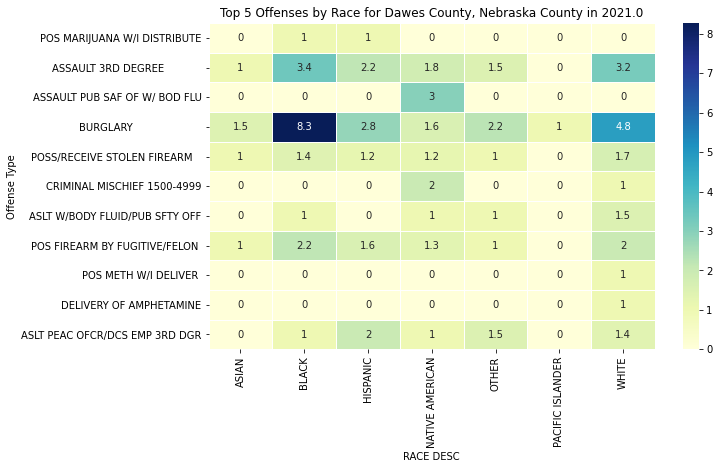

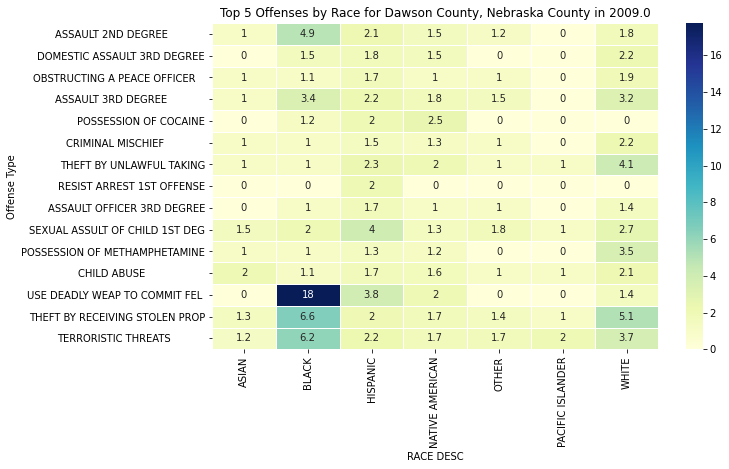

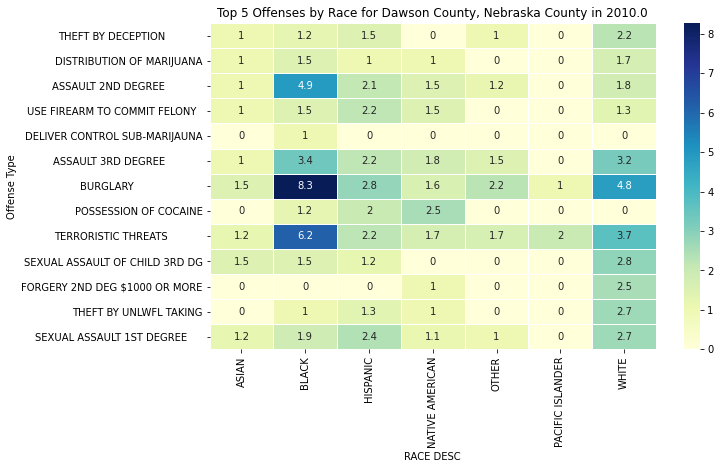

KeyboardInterrupt: 

In [34]:
# Pivot the data for heatmap
pivot_df = grouped_race.pivot_table(index='Offense Type', columns='RACE DESC', values='Count', fill_value=0)

unique_counties = grouped_race['County'].unique()
unique_years = grouped_race['Year of Sentence'].unique()

for county in unique_counties:
    for year in unique_years:
        # Filter based on the county and year
        filtered_group = grouped_race[(grouped_race['County'] == county) & (grouped_race['Year of Sentence'] == year)]
        
        # Check if there's data for the specific county-year combo
        if not filtered_group.empty:  
            # Get the relevant offenses for the specific county-year combination
            offenses_for_subset = filtered_group['Offense Type'].unique()
            
            # Use these offenses to filter the pivot_df
            subset = pivot_df.loc[offenses_for_subset]
            
            # Draw the heatmap
            plt.figure(figsize=(10, 6))
            sns.heatmap(subset, annot=True, cmap='YlGnBu', cbar=True, linewidths=0.5)
            plt.title(f'Top 5 Offenses by Race for {county} County in {year}')
            plt.show()

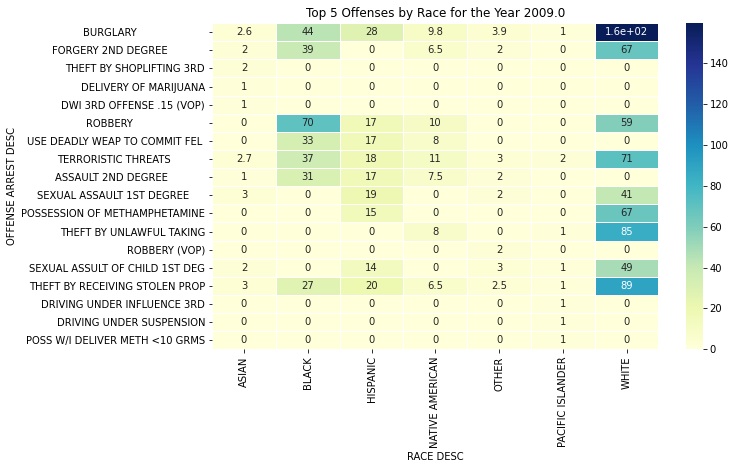

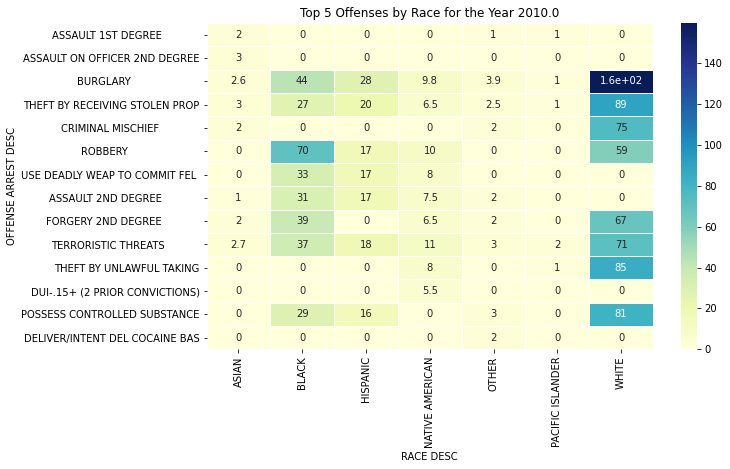

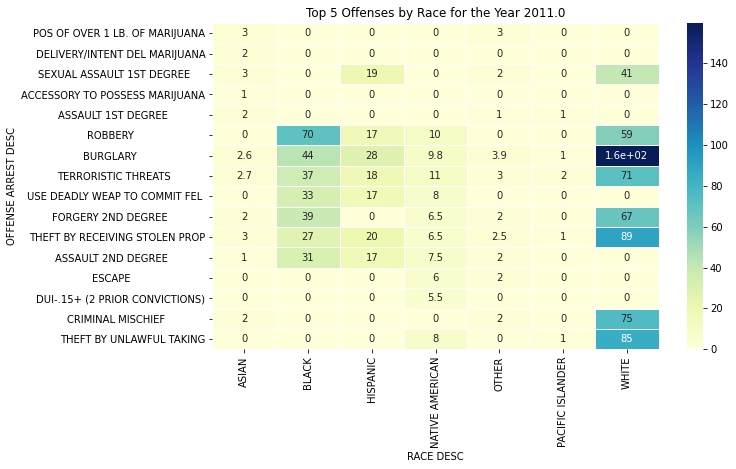

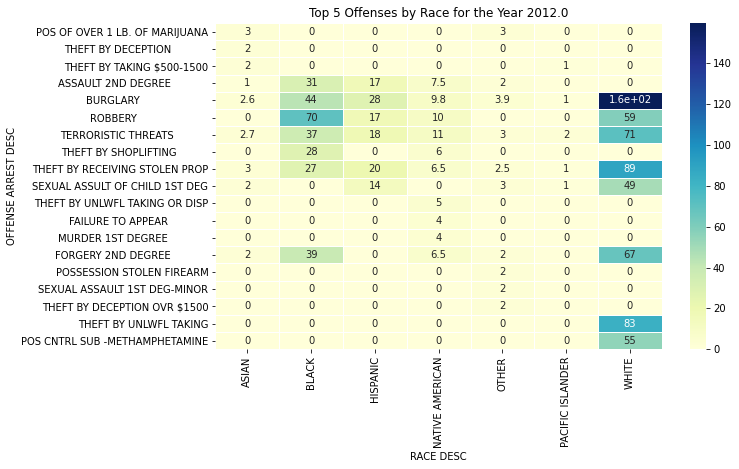

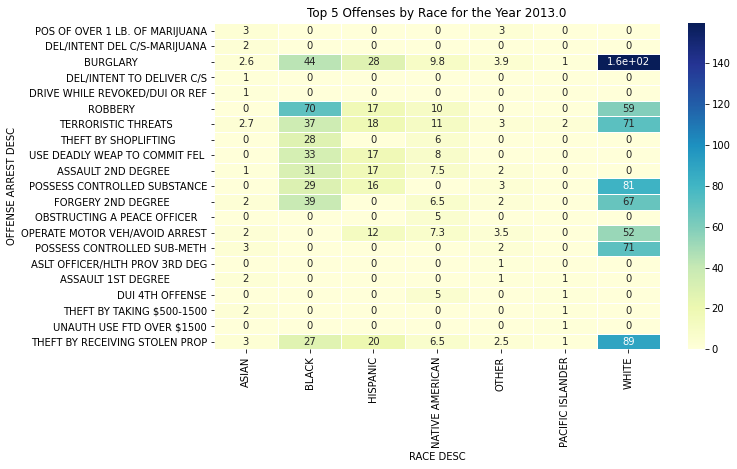

...

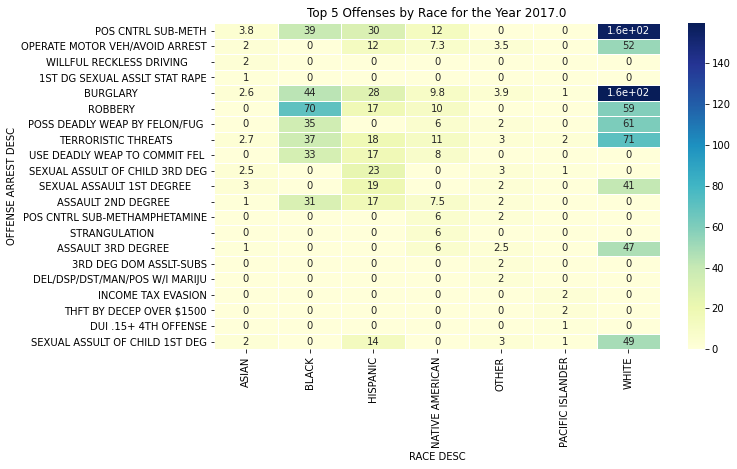

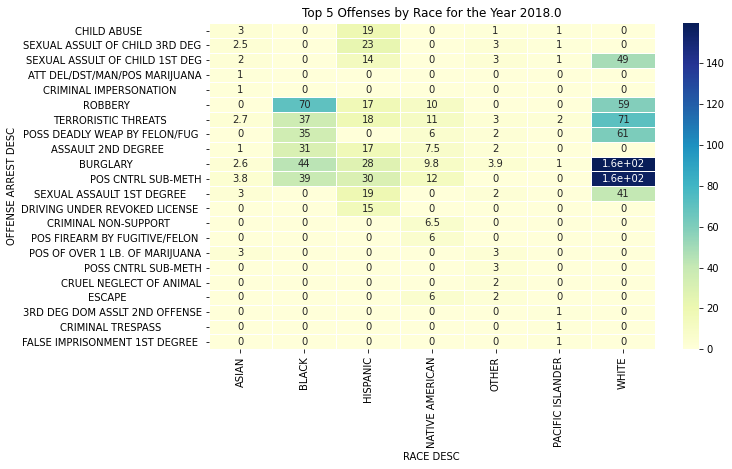

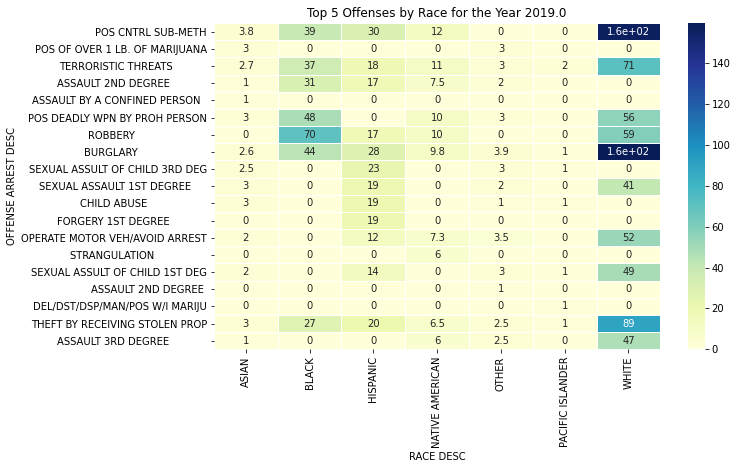

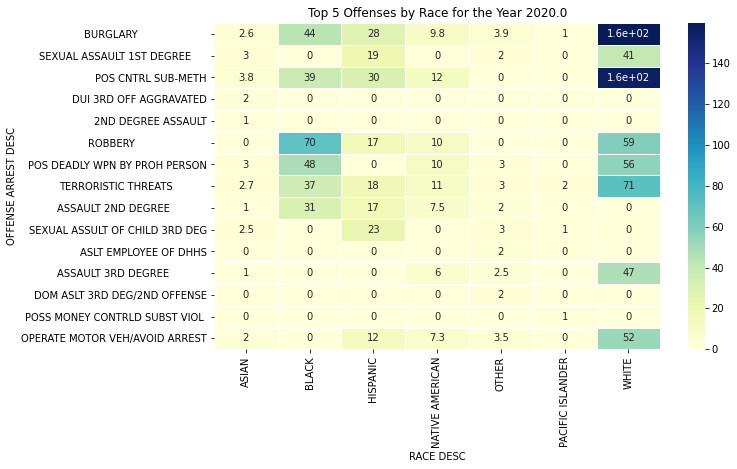

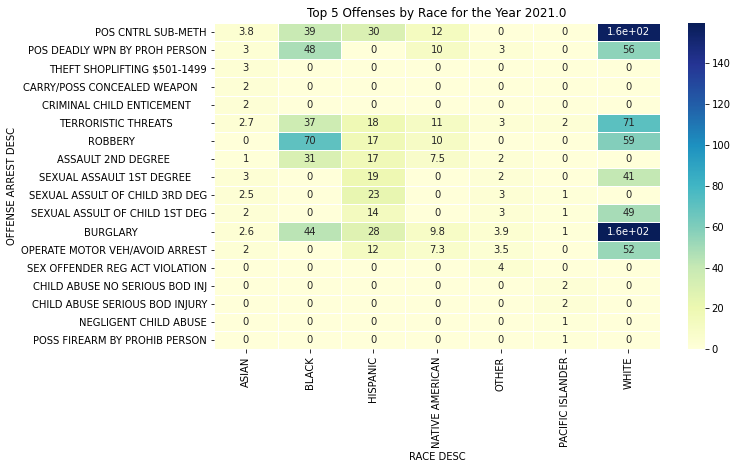

In [40]:
# Group by Year and Race, then aggregate counts of offenses
yearly_grouped_race = (filtered_df.groupby(['Year of Sentence', 'RACE DESC', 'OFFENSE ARREST DESC'])
                       .size()
                       .reset_index(name='Count'))

# Extract top 5 offenses by race for each year
top_offenses = (yearly_grouped_race.groupby(['Year of Sentence', 'RACE DESC'])
               .apply(lambda group: group.nlargest(5, 'Count'))
               .reset_index(drop=True))

# Pivot data for heatmap visualization
pivot_df = top_offenses.pivot_table(index='OFFENSE ARREST DESC', columns='RACE DESC', values='Count', fill_value=0)

unique_years = top_offenses['Year of Sentence'].unique()

for year in unique_years:
    # Filter top_offenses based on the year
    filtered_group = top_offenses[top_offenses['Year of Sentence'] == year]
    
    # Get the relevant offenses for the specific year
    offenses_for_subset = filtered_group['OFFENSE ARREST DESC'].unique()
    
    # Use these offenses to filter the pivot_df
    subset = pivot_df.loc[offenses_for_subset]
    
    # Draw the heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(subset, annot=True, cmap='YlGnBu', cbar=True, linewidths=0.5)
    plt.title(f'Top 5 Offenses by Race for the Year {year}')
    plt.show()

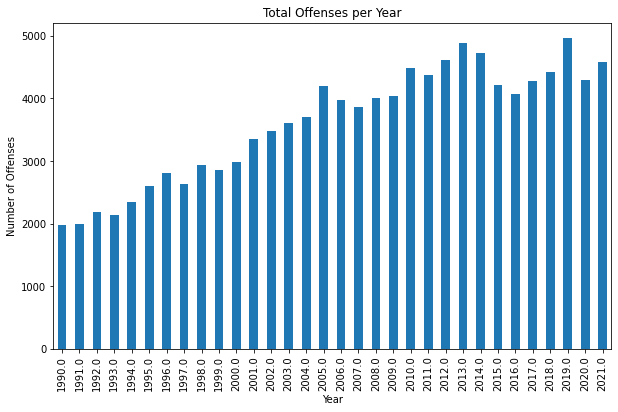

In [46]:
yearly_totals = filtered_df.groupby('Year of Sentence').size()
yearly_totals.plot(kind='bar', figsize=(10, 6))
plt.title('Total Offenses per Year')
plt.ylabel('Number of Offenses')
plt.xlabel('Year')
plt.show()

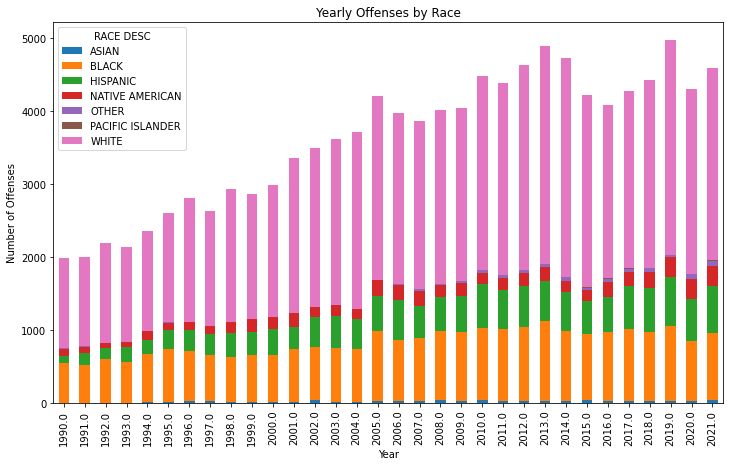

In [47]:
race_year_grouped = filtered_df.groupby(['Year of Sentence', 'RACE DESC']).size().unstack().fillna(0)
race_year_grouped.plot(kind='bar', stacked=True, figsize=(12, 7))
plt.title('Yearly Offenses by Race')
plt.ylabel('Number of Offenses')
plt.xlabel('Year')
plt.show()

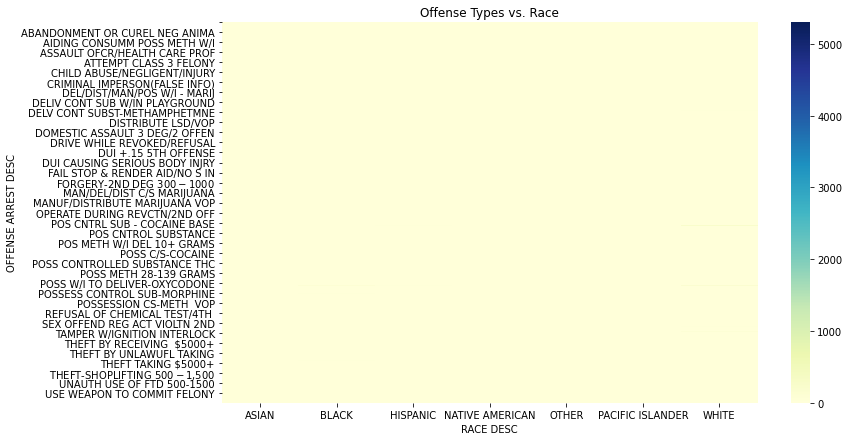

In [50]:
offense_race_grouped = filtered_df.groupby(['OFFENSE ARREST DESC', 'RACE DESC']).size().unstack().fillna(0)
plt.figure(figsize=(12, 7))
sns.heatmap(offense_race_grouped, cmap='YlGnBu')
plt.title('Offense Types vs. Race')
plt.show()

In [52]:
# Filter for drug-related offenses
drug_terms = ['Drug', 'Narcotic', 'Meth', 'Cannabis', 'Marijuana', 'Cocaine']  # Add more terms if necessary
drug_related = filtered_df[filtered_df['OFFENSE ARREST DESC'].str.contains('|'.join(drug_terms), case=False, na=False)]

In [53]:
yearly_drug_offenses = drug_related.groupby('Year of Sentence').size()

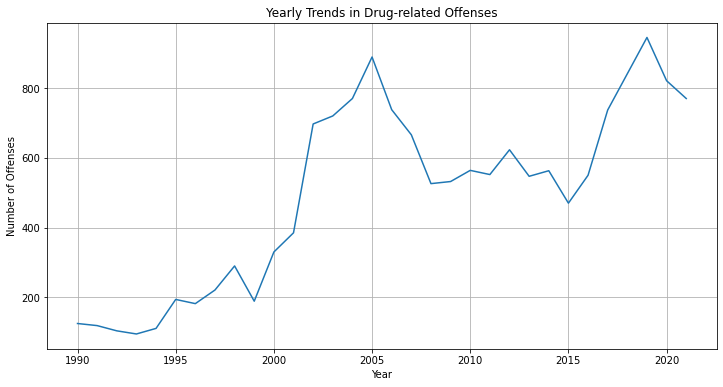

In [54]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
yearly_drug_offenses.plot()
plt.title('Yearly Trends in Drug-related Offenses')
plt.xlabel('Year')
plt.ylabel('Number of Offenses')
plt.grid(True)
plt.show()

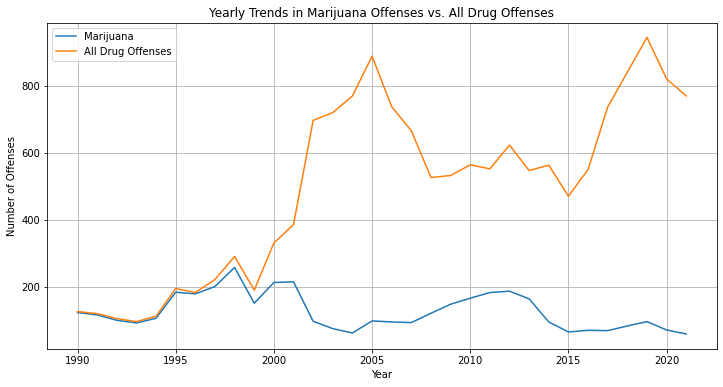

In [55]:
specific_drug = 'Marijuana'  # example
specific_drug_df = drug_related[drug_related['OFFENSE ARREST DESC'].str.contains(specific_drug, case=False, na=False)]
yearly_specific_drug_offenses = specific_drug_df.groupby('Year of Sentence').size()

# Visualization
plt.figure(figsize=(12, 6))
yearly_specific_drug_offenses.plot(label=specific_drug)
yearly_drug_offenses.plot(label='All Drug Offenses')
plt.title(f'Yearly Trends in {specific_drug} Offenses vs. All Drug Offenses')
plt.xlabel('Year')
plt.ylabel('Number of Offenses')
plt.legend()
plt.grid(True)
plt.show()

In [60]:
# Filter for low-level drug-related offenses
low_level_terms = ['Possession', 'Personal Use']
exclude_terms = ['Trafficking', 'Distribution', 'Manufacturing', 'Sale']
# Filter for high-level drug-related offenses
high_level_terms = ['Trafficking', 'Distribution', 'Manufacturing', 'Sale']

low_level_drug_related = filtered_df[filtered_df['OFFENSE ARREST DESC'].str.contains('|'.join(low_level_terms), case=False, na=False)]
low_level_drug_related = low_level_drug_related[~low_level_drug_related['OFFENSE ARREST DESC'].str.contains('|'.join(exclude_terms), case=False, na=False)]
high_level_drug_related = filtered_df[filtered_df['OFFENSE ARREST DESC'].str.contains('|'.join(high_level_terms), case=False, na=False)]

In [61]:
yearly_low_level_drug_offenses = low_level_drug_related.groupby('Year of Sentence').size()
yearly_high_level_drug_offenses = high_level_drug_related.groupby('Year of Sentence').size()


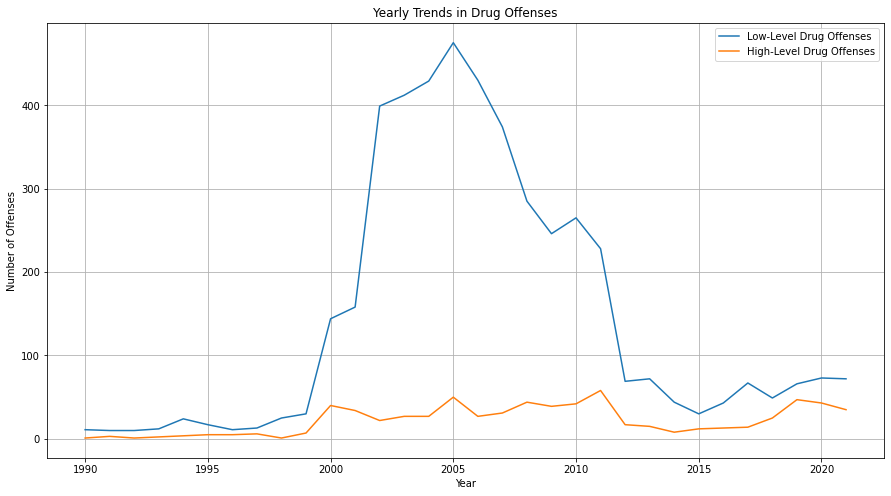

In [62]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 8))
yearly_low_level_drug_offenses.plot(label='Low-Level Drug Offenses')
yearly_high_level_drug_offenses.plot(label='High-Level Drug Offenses')
plt.title('Yearly Trends in Drug Offenses')
plt.xlabel('Year')
plt.ylabel('Number of Offenses')
plt.legend()
plt.grid(True)
plt.show()


The mid-2000s saw an increasing shift in the national perspective regarding drug offenses. This was a move towards viewing drug abuse more as a public health issue rather than a strictly criminal justice issue.

Several states undertook efforts to reclassify drug possession offenses from felonies to misdemeanors, reduce mandatory minimum sentences for drug offenses, or otherwise reform drug sentencing practices in the 2000s.

In [79]:
filtered_df_2010 = merged_df[(merged_df['Year of Sentence'] >= 2010) & (merged_df['Year of Sentence'] <= 2021)]
filtered_df_2010['COUNTY COMMITTED'] = filtered_df_2010['COUNTY COMMITTED'].str.strip()
filtered_df_2010 = filtered_df_2010[filtered_df_2010['COUNTY COMMITTED'] != '']
filtered_df_2010 = filtered_df_2010[filtered_df_2010['COUNTY COMMITTED'] != 'OUT OF STATE']
filtered_df_2010['RACE DESC'] = filtered_df_2010['RACE DESC'].replace(['                              ', 'HAWAIIAN ISLANDER             '], 'OTHER')
filtered_df_2010['RACE DESC'] = filtered_df_2010['RACE DESC'].str.strip()
filtered_df_2010['Year of Sentence'] = filtered_df_2010['Year of Sentence'].astype(int)

<ipython-input-79-41d95bc20c33>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df_2010['COUNTY COMMITTED'] = filtered_df_2010['COUNTY COMMITTED'].str.strip()


In [80]:
filtered_df_2010['County'] = filtered_df_2010['COUNTY COMMITTED'].apply(lambda x: f'{x.strip().capitalize()} County, Nebraska')

In [113]:
# List of race descriptions and their corresponding income columns
race_columns_map = {
    'White': 'Median Household Income (White Alone)',
    'Black or African American': 'Median Household Income (Black or African American Alone)',
    'American Indian and Alaska Native': 'Median Household Income (American Indian and Alaska Native Alone)',
    'Asian': 'Median Household Income (Asian Alone)',
    'Native Hawaiian and Other Pacific Islander': 'Median Household Income (Native Hawaiian and Other Pacific Islander Alone)',
    'Some Other Race Alone': 'Median Household Income (Some Other Race Alone)',
    'Two or More Races': 'Median Household Income (Two or More Races)',
    'Hispanic or Latino': 'Median Household Income (Hispanic or Latino)'
}

# Melt the dataframe
income_melted = neb.melt(id_vars=['Year'], 
                        value_vars=list(race_columns_map.values()), 
                        var_name='Income Type', 
                        value_name='Median Household Income')

# Map the 'Income Type' back to a more standard race description
income_melted['RACE DESC'] = income_melted['Income Type'].map({v: k for k, v in race_columns_map.items()})
income_melted.drop(columns='Income Type', inplace=True)


In [115]:
# Aggregating the number of offenses by year and race
offenses_by_year_race = filtered_df_2010.groupby(['Year of Sentence', 'RACE DESC']).size().reset_index(name='Number of Offenses')

# Aggregating median income data by year and race
median_incomes = income_melted.groupby(['Year', 'RACE DESC']).agg({'Median Household Income': 'mean'}).reset_index()


In [116]:
# Mapping for standardizing race descriptions
race_mapping = {
    'ASIAN': 'Asian',
    'BLACK': 'Black or African American',
    'HISPANIC': 'Hispanic or Latino',
    'NATIVE AMERICAN': 'American Indian and Alaska Native',
    'OTHER': 'Some Other Race Alone',  # This is an assumption; adjust if needed
    'PACIFIC ISLANDER': 'Native Hawaiian and Other Pacific Islander',
    'WHITE': 'White'
}

# Apply the mapping to the offenses_by_year_race dataframe
offenses_by_year_race['RACE DESC'] = offenses_by_year_race['RACE DESC'].map(race_mapping)

# Note: The 'Two or More Races' category isn't present in offenses_by_year_race. 
# You might need additional data or further decision-making on how to handle this.


In [117]:
# Merging on year and race
merged_data = pd.merge(offenses_by_year_race, median_incomes, left_on=['Year of Sentence', 'RACE DESC'], right_on=['Year', 'RACE DESC'])

In [90]:

offenses_by_year_race['RACE DESC'].unique()

array(['ASIAN', 'BLACK', 'HISPANIC', 'NATIVE AMERICAN', 'OTHER',
       'PACIFIC ISLANDER', 'WHITE'], dtype=object)

In [89]:
median_incomes['RACE DESC'].unique()

array(['American Indian and Alaska Native', 'Asian',
       'Black or African American', 'Hispanic or Latino',
       'Native Hawaiian and Other Pacific Islander',
       'Some Other Race Alone', 'Two or More Races', 'White'],
      dtype=object)

In [119]:
merged_data.to_csv('correlation_data_income_race_Nebraska.csv', index=False)

In [96]:
median_value = merged_data[merged_data['Median Household Income'] >= 0]['Median Household Income'].median()
merged_data.loc[merged_data['Median Household Income'] < 0, 'Median Household Income'] = median_value


In [118]:
merged_data['Median Household Income'].unique()

array([53189.375     , 31881.        , 36613.82191781, 33714.62857143,
       38266.29787234, 24218.8       , 43590.34408602, 46628.84375   ,
       29002.31578947, 36793.05333333, 39868.69444444, 37597.76595745,
       45274.75268817, 47490.875     , 36841.84210526, 40106.05194805,
       40183.39473684, 36715.09756098, 46315.10752688, 51447.63636364,
       30659.78571429, 38977.56756757, 35749.21428571, 43493.32352941,
       52660.6       , 47195.02150538, 55581.33333333, 32238.85714286,
       38017.02666667, 30954.57692308, 44544.08823529, 54887.2       ,
       48742.30107527, 59907.6875    , 30251.18181818, 40869.91071429,
       32165.25      , 46085.96428571, 45863.33333333, 49299.87096774,
       48385.        , 34674.7       , 42818.38709677, 33503.04545455,
       47704.        , 55023.66666667, 50589.43010753, 60360.77777778,
       40617.90909091, 46437.82258065, 35435.15789474, 51601.59375   ,
       63664.        , 52576.53763441, 63319.1875    , 44868.72727273,
      

In [105]:
median_value = income_melted[income_melted['Median Household Income'] >= 0]['Median Household Income'].median()
income_melted.loc[income_melted['Median Household Income'] < 0, 'Median Household Income'] = median_value

In [114]:
income_melted = income_melted[income_melted['Median Household Income'] >= 0]

In [ ]:
# Create a DataFrame that counts how many times each person has been booked per year
offense_counts_yearly = filtered_df.groupby(['ID NUMBER', 'RACE DESC', 'County', 'Year of Sentence']).size().reset_index(name='Counts')

# Mark rows where Counts > 1, indicating a repeat offense in that year
offense_counts_yearly['Is Recidivist'] = offense_counts_yearly['Counts'] > 1

# Calculate recidivism rate by race, county, and year
recidivism_rate_yearly = offense_counts_yearly.groupby(['RACE DESC', 'County', 'Year of Sentence'])['Is Recidivist'].mean().reset_index()

# Convert to percentage
recidivism_rate_yearly['Recidivism Rate (%)'] = recidivism_rate_yearly['Is Recidivist'] * 100

# Visualization
plt.figure(figsize=(20,10))
sns.lineplot(data=recidivism_rate_yearly, x='Year of Sentence', y='Recidivism Rate (%)', hue='RACE DESC', style='County')
plt.xticks(rotation=45)
plt.title('Yearly Recidivism Rate by Race and County')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()
plt.show()


In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(data=recidivism_rate, x='RACE DESC', y='Recidivism Rate (%)', hue='County')
plt.xticks(rotation=45)
plt.title('Recidivism Rate by Race and County')
plt.show()

In [128]:
recidivism_rate_yearly.to_csv('Recidivism_Rate_Nebraska_Year_And_Race.csv')

In [126]:
recidivism_rate_yearly.head()

,RACE DESC,County,Year of Sentence,Is Recidivist,Recidivism Rate (%)
0,ASIAN,"Adams County, Nebraska",1995.0,0.0,0.0
1,ASIAN,"Adams County, Nebraska",2002.0,0.0,0.0
2,ASIAN,"Adams County, Nebraska",2005.0,1.0,100.0
3,ASIAN,"Adams County, Nebraska",2011.0,0.0,0.0
4,ASIAN,"Box butte County, Nebraska",1997.0,1.0,100.0


In [132]:
# Grouping by year and offense type and counting the number of occurrences
yearly_offenses = filtered_df.groupby(['Year of Sentence', 'OFFENSE ARREST DESC']).size().unstack().fillna(0)

plt.figure(figsize=(15, 8))

# Plotting the trend for each offense type
for offense in yearly_offenses.columns:
    sns.lineplot(data=yearly_offenses, x=yearly_offenses.index, y=offense, label=offense)

plt.title('Trend of Different Offenses Over Years')
plt.xlabel('Year of Sentence')
plt.ylabel('Number of Offenses')
plt.legend(title='Offense Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

Exception ignored in: <function WeakMethod.__new__.<locals>._cb at 0x153f20870790>
Traceback (most recent call last):
  File "/share/pkg.7/python3/3.8.10/install/lib/python3.8/weakref.py", line 51, in _cb
    def _cb(arg):
KeyboardInterrupt: 


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x153f2b78bb80> (for post_execute):


KeyboardInterrupt: 

In [133]:
filtered_df.columns

Index(['ID NUMBER', 'OFFENSE MINIMUM YEAR OR TERM', 'MINIMUM MONTH',
       'MINIMUM DAY', 'OFFENSE MAXIMUM YEAR OR TERM', 'MAXIMUM MONTH',
       'MAXIMUM DAY', 'OFFENSE MAN MIN YEAR OR TERM', 'MAN MIN MONTH',
       'MAN MIN DAY', 'OFFENSE ARREST DESC', 'FELONY MSDMNR CODE',
       'FELONY MSDMNR DESC', 'OFFENSE TYPE CODE', 'OFFENSE ATTEMPT DESC',
       'HABITUAL CRIMINAL', 'OFFENSE RUN CODE', 'COUNTY COMMITTED',
       'COMMITTED LAST NAME', 'FIRST NAME', 'MIDDLE NAME', 'NAME EXTENSION',
       'LEGAL LAST NAME', 'DATE OF BIRTH', 'SENTENCE BEGIN DATE',
       'DATE OF BIRTH', 'RACE DESC', 'GENDER', 'Year of Sentence', 'County'],
      dtype='object')

In [153]:
data_df['OFFENSE MINIMUM YEAR OR TERM'] = data_df['OFFENSE MINIMUM YEAR OR TERM'].astype(int)
data_df['MINIMUM MONTH'] = data_df['MINIMUM MONTH'].astype(int)
data_df['MINIMUM DAY'] = data_df['MINIMUM DAY'].astype(int)
data_df['Sentence Duration (days)'] = data_df['OFFENSE MINIMUM YEAR OR TERM'] * 365 + data_df['MINIMUM MONTH'] * 30 + data_df['MINIMUM DAY']


<ipython-input-153-7f7beffc0fae>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['OFFENSE MINIMUM YEAR OR TERM'] = data_df['OFFENSE MINIMUM YEAR OR TERM'].astype(int)
<ipython-input-153-7f7beffc0fae>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['MINIMUM MONTH'] = data_df['MINIMUM MONTH'].astype(int)
<ipython-input-153-7f7beffc0fae>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

In [149]:
# Create a boolean mask to filter rows with string values
string_mask = filtered_df["OFFENSE MINIMUM YEAR OR TERM"].str.isalpha()

# Filter the DataFrame using the boolean mask
data_df = filtered_df[string_mask]

In [154]:
data_df.head()

,ID NUMBER,OFFENSE MINIMUM YEAR OR TERM,MINIMUM MONTH,MINIMUM DAY,OFFENSE MAXIMUM YEAR OR TERM,MAXIMUM MONTH,MAXIMUM DAY,OFFENSE MAN MIN YEAR OR TERM,MAN MIN MONTH,MAN MIN DAY,...,NAME EXTENSION,LEGAL LAST NAME,DATE OF BIRTH,SENTENCE BEGIN DATE,DATE OF BIRTH,RACE DESC,GENDER,Year of Sentence,County,Sentence Duration (days)
215,27642,90,0,0,95,0.0,0.0,0,0,0,...,,NaN,5/18/1955,12/1/2015,5/18/1955,BLACK,MALE,2015.0,"Douglas County, Nebraska",32850
216,27642,0,0,0,5,0.0,0.0,0,0,0,...,,NaN,5/18/1955,12/1/2015,5/18/1955,BLACK,MALE,2015.0,"Lancaster County, Nebraska",0
744,29333,110,0,0,126,0.0,0.0,0,0,0,...,,NaN,7/22/1956,2/3/2017,7/22/1956,WHITE,MALE,2017.0,"Douglas County, Nebraska",40150
983,29852,84,0,0,90,0.0,0.0,0,0,0,...,,NaN,7/26/1957,12/18/2015,7/26/1957,WHITE,MALE,2015.0,"Douglas County, Nebraska",30660
1072,30012,65,0,0,82,0.0,0.0,0,0,0,...,,ABDULLAH,2/4/1958,11/30/2015,2/4/1958,BLACK,MALE,2015.0,"Douglas County, Nebraska",23725


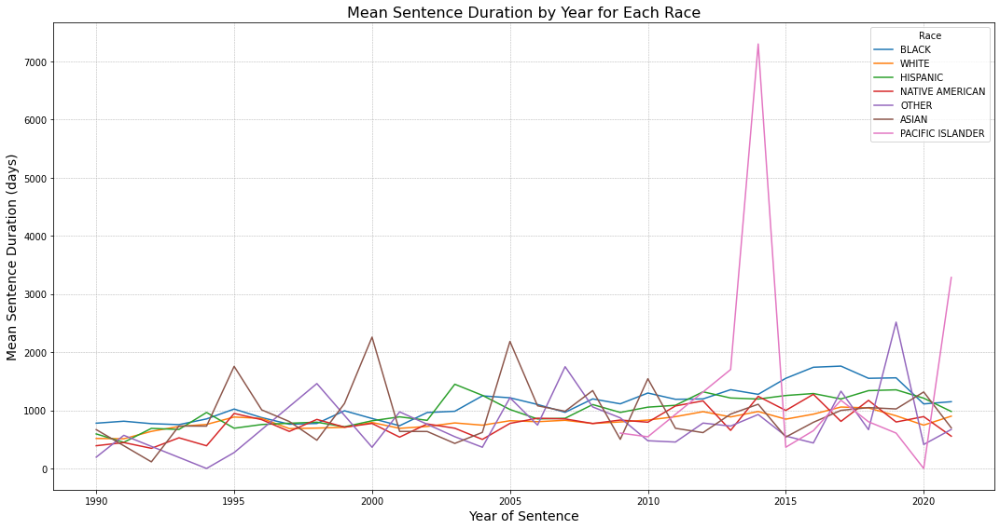

In [165]:
# Group by the 'Year of Sentence' and 'RACE DESC' columns and compute the mean sentence duration
grouped_data = data_df.groupby(['Year of Sentence', 'RACE DESC'])['Sentence Duration (days)'].mean().reset_index()

# Set up the plot
plt.figure(figsize=(15, 8))

# Use Seaborn to create a line plot for each race
races = data_df['RACE DESC'].unique()
for race in races:
    subset = grouped_data[grouped_data['RACE DESC'] == race]
    sns.lineplot(data=subset, x='Year of Sentence', y='Sentence Duration (days)', label=race)

# Add title and labels
plt.title('Mean Sentence Duration by Year for Each Race', fontsize=16)
plt.xlabel('Year of Sentence', fontsize=14)
plt.ylabel('Mean Sentence Duration (days)', fontsize=14)
plt.legend(title='Race')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Adding a grid for clarity

plt.tight_layout()
plt.show()

In [18]:
# Stripping white spaces from 'INST RELEASE TYPE'
merged_df['INST RELEASE TYPE'] = merged_df['INST RELEASE TYPE'].str.strip()

# Convert 'INST RELEASE DATE' to a proper datetime format
merged_df['INST RELEASE DATE'] = pd.to_datetime(merged_df['INST RELEASE DATE'], errors='coerce')

In [26]:
# Filter the dataframe for individuals who have died
deceased_df = unique_deaths_df[unique_deaths_df['INST RELEASE TYPE'].str.contains("Deceased|Died", case=False, na=False)]

# Group by county and race to get counts
death_counts = deceased_df.groupby(['COUNTY COMMITTED', 'RACE DESC']).size().reset_index(name='Death Count')

In [27]:
death_counts.head()

,COUNTY COMMITTED,RACE DESC,Death Count
0,ADAMS,WHITE,7
1,BOX BUTTE,NATIVE AMERICAN,2
2,BOX BUTTE,WHITE,4
3,BROWN,WHITE,1
4,BUFFALO,BLACK,1


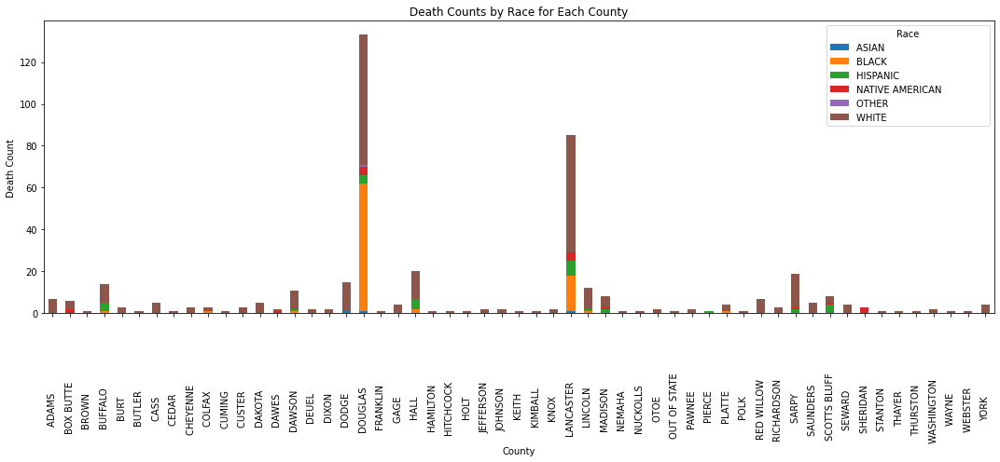

In [28]:
# Pivot the dataframe to prepare for stacked bar chart
pivot_df = death_counts.pivot(index='COUNTY COMMITTED', columns='RACE DESC', values='Death Count')
pivot_df = pivot_df.fillna(0)  # replace NaN values with 0

# Plot
ax = pivot_df.plot(kind='bar', stacked=True, figsize=(15,7))
plt.title('Death Counts by Race for Each County')
plt.xlabel('County')
plt.ylabel('Death Count')
plt.legend(title='Race')
plt.tight_layout()
plt.show()

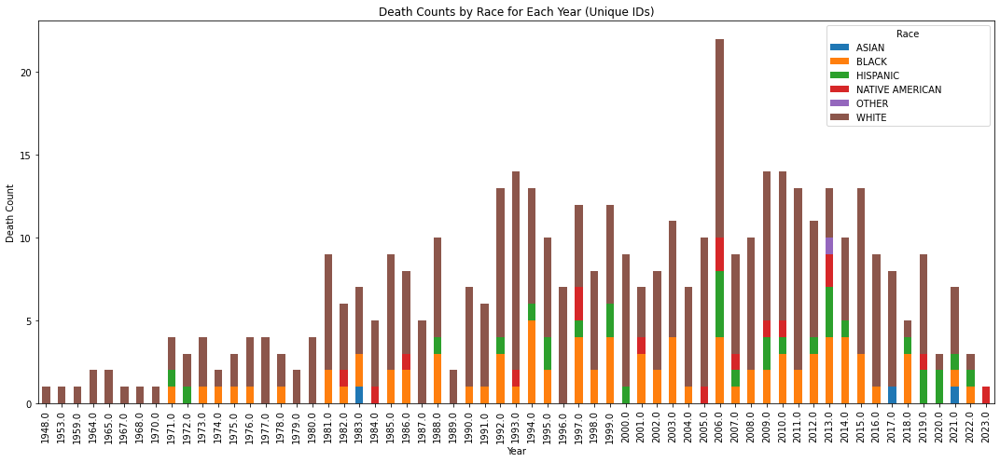

In [25]:
# Filter rows where release type is "DEATH" and drop duplicate ID entries
unique_deaths_df = merged_df[merged_df['INST RELEASE TYPE'].str.contains("Deceased|Died", case=False, na=False)].drop_duplicates(subset='ID NUMBER')

# Grouping by year and race to get death counts of unique IDs
death_counts_year = unique_deaths_df.groupby(['Year of Sentence', 'RACE DESC']).size().reset_index(name='Death Count')

# Pivot for stacked bar chart
pivot_df_year = death_counts_year.pivot(index='Year of Sentence', columns='RACE DESC', values='Death Count')
pivot_df_year = pivot_df_year.fillna(0)  # Replace NaN values with 0

# Plotting
ax = pivot_df_year.plot(kind='bar', stacked=True, figsize=(15,7))
plt.title('Death Counts by Race for Each Year (Unique IDs)')
plt.xlabel('Year')
plt.ylabel('Death Count')
plt.legend(title='Race')
plt.tight_layout()
plt.show()
